# Facial Recognition with TensorFlow

## Unsupervised Learning

### About the Dataset
A popular component of computer vision and deep learning revolves around identifying faces for various applications from logging into your phone with your face or searching through surveillance images for a particular suspect. This dataset is great for training and testing models for face detection, particularly for recognising facial attributes such as finding people with brown hair, are smiling, or wearing glasses. Images cover large pose variations, background clutter, diverse people, supported by a large quantity of images and rich annotations. This data was originally collected by researchers at MMLAB, The Chinese University of Hong Kong (specific reference in Acknowledgment section).

### Purpose of this Notebook

The goal of this notebook is to create an unsupervised learning model that can cluster celebrity with similar facial features.  To achieve this goal we will be working with about 40,000 random images of celebrities.  In order to work with these images we will be using Keras and an autoencoder to transform these image into few dimensions to map similarities. Then decoded the images back into their original shape.  After we have our clusters we can evaluate the model and see how the clusters are made up.

In [1]:
# Basic lib imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import keras as ks
from skimage import io
import os
import csv

C:\Users\etallen127\AppData\Local\Continuum\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# setting up dataframe with attributes
attr = pd.read_csv('list_attr_celeba.csv')

In [3]:
# changing values to categorical
hair = pd.DataFrame(np.where(attr > 0, 1, 0),columns=['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young'])

In [4]:
# drop extra index column
hair.drop(['image_id'], axis=1,inplace=True)

In [5]:
# get ride of any column without an attribute
hair = hair[(hair.T != 0).any()]

In [6]:
# set index for target images
target_images = hair.index

In [6]:
# Importing cv2 to help work with images
import cv2

# Creating a function to format images
def load_images(path):
    img_data = [] # return the image itself
    index = [] # adds an index to reference image
    x = -1
    for pic in os.listdir(path):
        pic_path = os.path.join(path,pic)
        for img in os.listdir(pic_path):
            x += 1
            if x in target_images: # set of targeted images
                img_path = os.path.join(pic_path,img)
                image = cv2.imread(img_path)
                image = cv2.resize(image, (64, 64))
                image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
                img_data.append(image)
                index.append(x)
    return(np.array(img_data),np.array(index)) # output arrays

In [8]:
# Setting up fill location for our load_images function
train_path = 'images'

In [9]:
# image arrays saved to X, index values saved to img_num
(X, img_num) = load_images(train_path)

In [10]:
# Do to size issues cut x to first 40,000
i = X[0:40000]

In [11]:
# Reshaping image array to encoder
j = i.reshape((i.shape[0], -1))
j = np.divide(j, 255.)

In [13]:
# Importing modeling tools
from time import time
import numpy as np
import keras.backend as K
from keras.engine.topology import Layer, InputSpec
from keras.layers import Dense, Input
from keras.models import Model
from keras.optimizers import SGD
from keras import callbacks
from keras.initializers import VarianceScaling
from sklearn.cluster import KMeans

In [14]:
# autoencoder from github 
def autoencoder(dims, act='relu', init='glorot_uniform'):
    """
    Fully connected auto-encoder model, symmetric.
    Arguments:
        dims: list of number of units in each layer of encoder. dims[0] is input dim, dims[-1] is units in hidden layer.
            The decoder is symmetric with encoder. So number of layers of the auto-encoder is 2*len(dims)-1
        act: activation, not applied to Input, Hidden and Output layers
    return:
        (ae_model, encoder_model), Model of autoencoder and model of encoder
    """
    n_stacks = len(dims) - 1
    # input
    input_img = Input(shape=(dims[0],), name='input')
    x = input_img
    # internal layers in encoder
    for i in range(n_stacks-1):
        x = Dense(dims[i + 1], activation=act, kernel_initializer=init, name='encoder_%d' % i)(x)

    # hidden layer
    encoded = Dense(dims[-1], kernel_initializer=init, name='encoder_%d' % (n_stacks - 1))(x)  # hidden layer, features are extracted from here

    x = encoded
    # internal layers in decoder
    for i in range(n_stacks-1, 0, -1):
        x = Dense(dims[i], activation=act, kernel_initializer=init, name='decoder_%d' % i)(x)

    # output
    x = Dense(dims[0], kernel_initializer=init, name='decoder_0')(x)
    decoded = x
    return Model(inputs=input_img, outputs=decoded, name='AE'), Model(inputs=input_img, outputs=encoded, name='encoder')

In [15]:
# dims and init for autoencoder
dims = [j.shape[-1], 500, 500, 2000, 10]
init = VarianceScaling(scale=1. / 3., mode='fan_in',
                           distribution='uniform')
# optimizer for compiling
pretrain_optimizer = SGD(lr=1, momentum=0.9)

# setting for fitting 
pretrain_epochs = 3
batch_size = 256

In [16]:
# setting up autoencoder
autoencoder, encoder = autoencoder(dims, init=init)

In [17]:
# compiling and fitting model
autoencoder.compile(optimizer=pretrain_optimizer, loss='mse')
autoencoder.fit(j, j, batch_size=batch_size, epochs=pretrain_epochs) #, callbacks=cb)

Epoch 1/3
40000/40000 [==============================] - 88s 2ms/step - loss: 0.1720
Epoch 2/3
40000/40000 [==============================] - 80s 2ms/step - loss: 0.0806
Epoch 3/3
40000/40000 [==============================] - 80s 2ms/step - loss: 0.0806


Whenever I tried to run the model through more epochs I would come acrossed nan values

In [18]:
# settings for k means
kmeans = KMeans(n_clusters=10, n_init=10,n_jobs=8)

# creating clusters
y_pred = kmeans.fit_predict(encoder.predict(j))

In [11]:
# getting index values for y_preds
target_indexes = img_num[0:40000]

In [12]:
# grabbing the image we processed
df = hair.iloc[target_indexes]

In [31]:
# assigning their cluster
df['group'] = (y_pred + 1)

C:\Users\etallen127\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [15]:
# saving group values into new csv so it can be call on new kernel
# df.to_csv('40k_grouped.csv')

In [7]:
# calling new csv
a = pd.read_csv('40k_grouped.csv')

In [52]:
# display function from https://gist.github.com/soply/f3eec2e79c165e39c9d540e916142ae1
def show_images(images, cols = 5, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

In [20]:
# targeting first group of images
group_one = a[a['group'] == 1]

In [24]:
# grabbing 30 random images and their index 
gp_one_ids = list(group_one.index)
np.random.shuffle(gp_one_ids)
target_images = gp_one_ids[:30]

# processing the image grabbed above
train_path = 'images'
gp_one_image, img_num_one = load_images(train_path)

In [25]:
# Displaying images
show_images(gp_one_image)

In [57]:
# targeting first group of images
group_two = a[a['group'] == 2]

In [242]:
# grabbing 30 random images and their index 
# processing the images
gp_two_ids = list(group_two.index)
np.random.shuffle(gp_two_ids)
target_images = gp_two_ids[:30]
gp_two_image, img_num_two = load_images(train_path)

In [243]:
show_images(gp_two_image)

In [244]:
# grabbing 30 random images and their index 
# processing the images

group_three = a[a['group'] == 3]

gp_three_ids = list(group_three.index)
np.random.shuffle(gp_three_ids)
target_images = gp_three_ids[:30]
gp_three_image, img_num_three = load_images(train_path)

show_images(gp_three_image)

In [245]:
# grabbing 30 random images and their index 
# processing the images

group_four = a[a['group'] == 4]

gp_four_ids = list(group_four.index)
np.random.shuffle(gp_four_ids)
target_images = gp_four_ids[:30]
gp_four_image, img_num_four = load_images(train_path)

show_images(gp_four_image)

In [246]:
# grabbing 30 random images and their index 
# processing the images 

group_five = a[a['group'] == 5]

gp_five_ids = list(group_five.index)
np.random.shuffle(gp_five_ids)
target_images = gp_five_ids[:30]
gp_five_image, img_num_five = load_images(train_path)

show_images(gp_five_image)

In [247]:
# grabbing 30 random images and their index 
# processing the images

group_six = a[a['group'] == 6]

gp_six_ids = list(group_six.index)
np.random.shuffle(gp_six_ids)
target_images = gp_six_ids[:30]
gp_six_image, img_num_six = load_images(train_path)

show_images(gp_six_image)

In [248]:
# grabbing 30 random images and their index 
# processing the images

group_seven = a[a['group'] == 7]

gp_seven_ids = list(group_seven.index)
np.random.shuffle(gp_seven_ids)
target_images = gp_seven_ids[:30]
gp_seven_image, img_num_seven = load_images(train_path)

show_images(gp_seven_image)

In [249]:
# grabbing 30 random images and their index 
# processing the images

group_eight= a[a['group'] == 8]

gp_eight_ids = list(group_eight.index)
np.random.shuffle(gp_eight_ids)
target_images = gp_eight_ids[:30]
gp_eight_image, img_num_eight = load_images(train_path)

show_images(gp_eight_image)

In [250]:
# grabbing 30 random images and their index 
# processing the images

group_nine = a[a['group'] == 9]

gp_nine_ids = list(group_nine.index)
np.random.shuffle(gp_nine_ids)
target_images = gp_nine_ids[:30]
gp_nine_image, img_num_nine = load_images(train_path)

show_images(gp_nine_image)

In [53]:
# grabbing 30 random images and their index 
# processing the images

group_ten = a[a['group'] == 10]

gp_ten_ids = list(group_ten.index)
np.random.shuffle(gp_ten_ids)
target_images = gp_ten_ids[:30]
gp_ten_image, img_num_ten = load_images(train_path)

show_images(gp_ten_image)

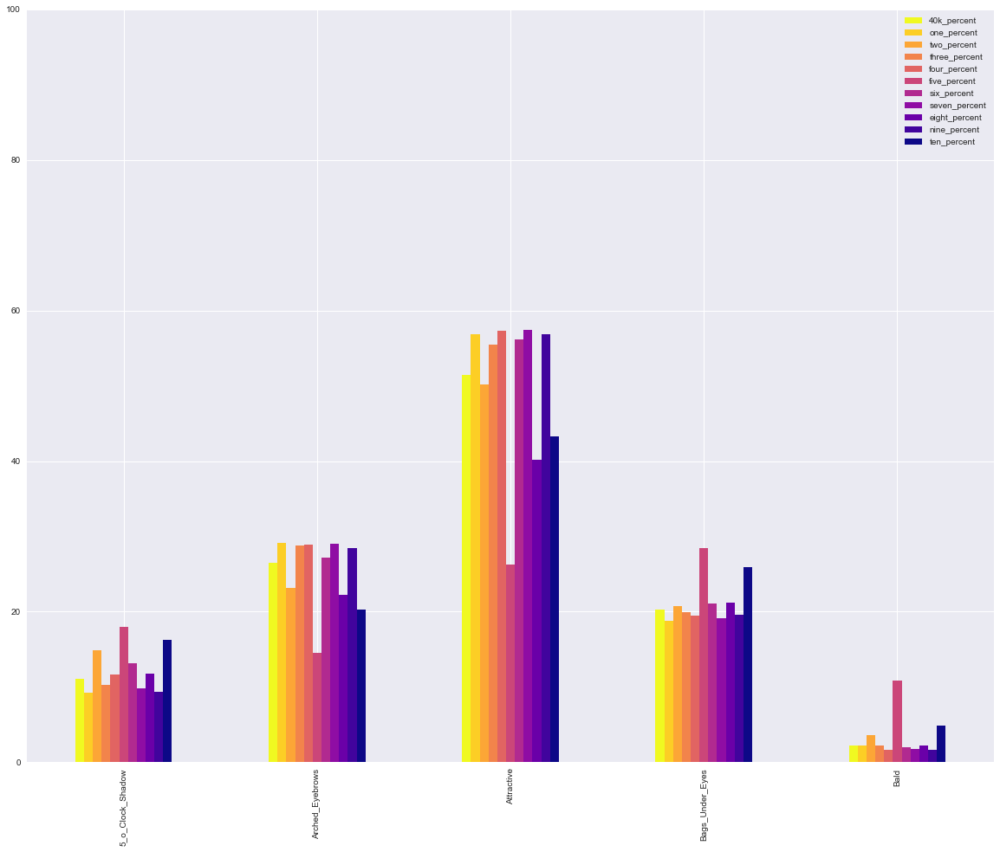

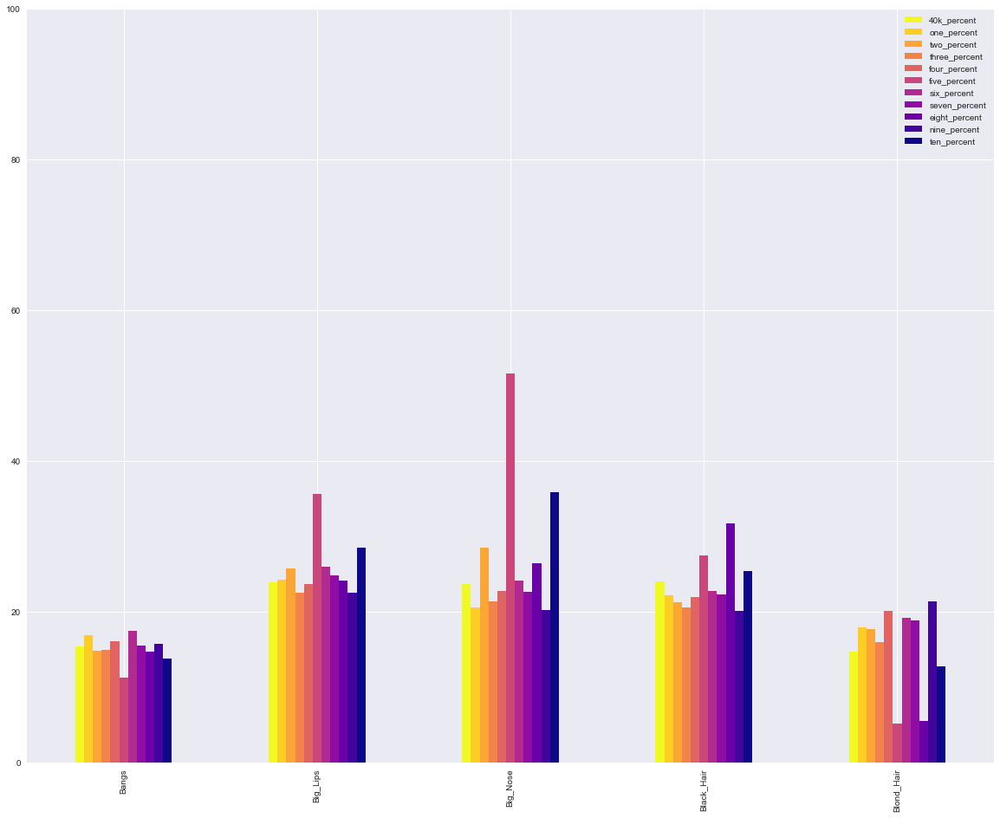

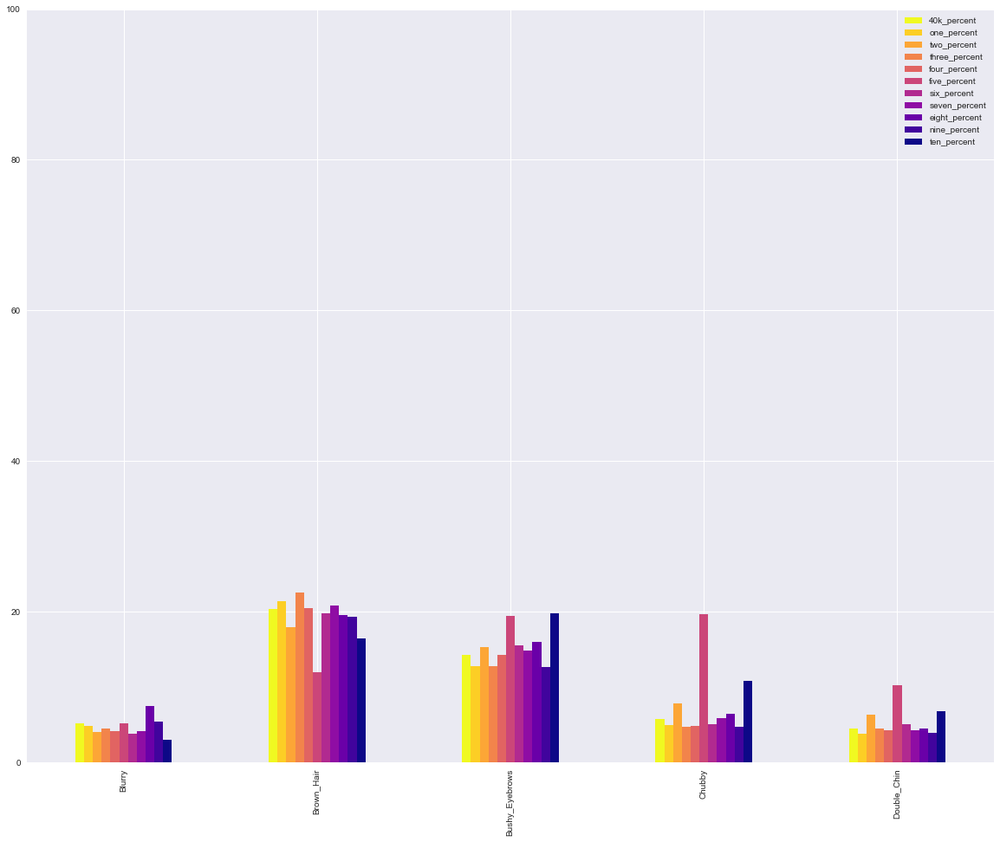

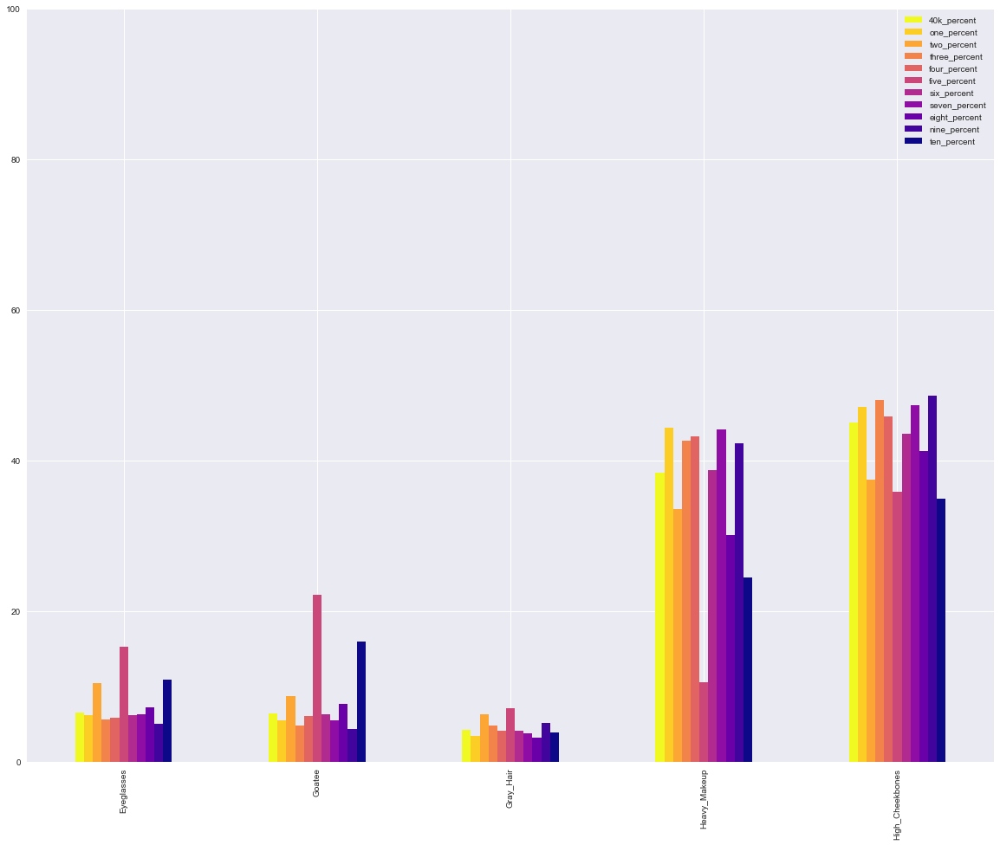

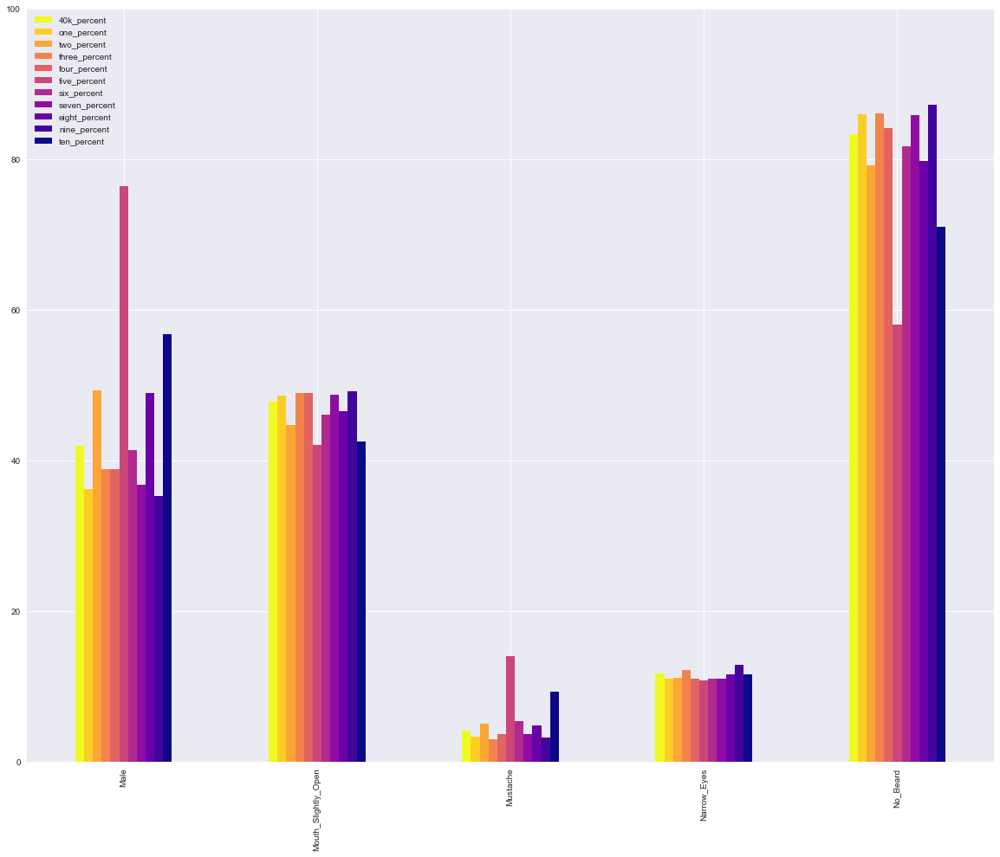

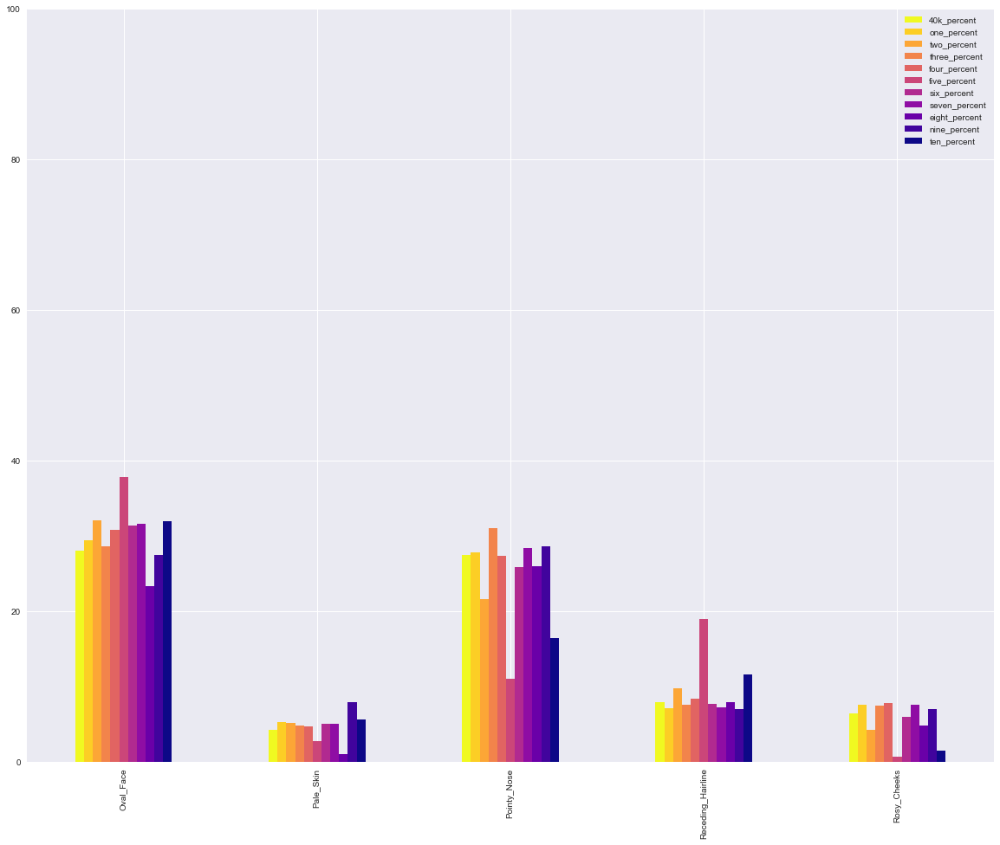

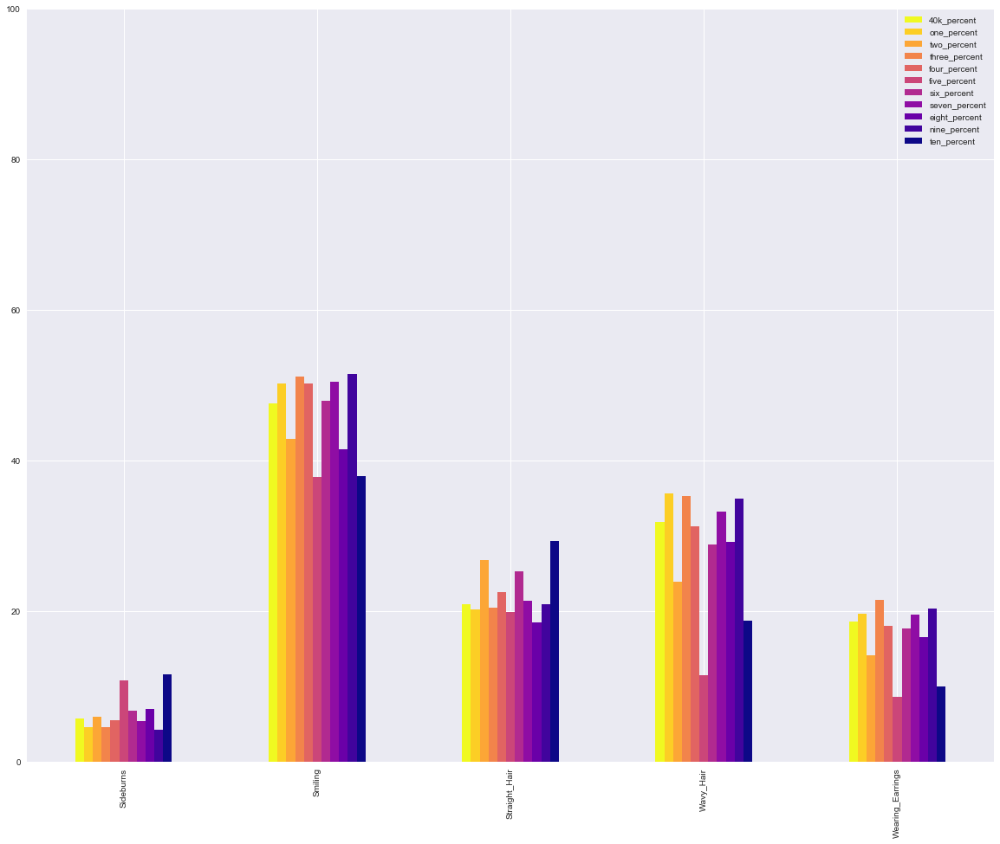

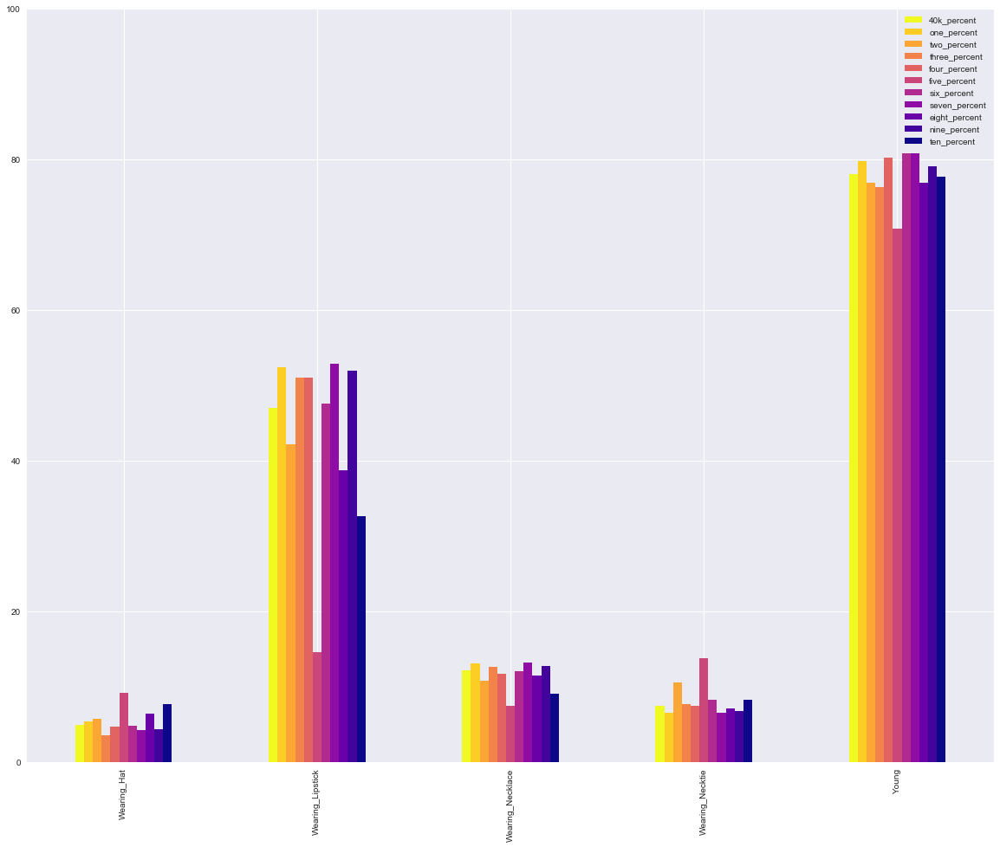

In [286]:
# plotting percent of the group that has listed attribute in comparision
# to the other clusters and the over all group
# each chart is seperated into 5 attributes

percent[0:5].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[5:10].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[10:15].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[15:20].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[20:25].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[25:30].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[30:35].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
percent[35:40].plot(kind='bar',ylim=(0,100),colormap='plasma_r',figsize= (20,16))
plt.show()

From these chart we can tell a lot about each groups make up.  The group that stands out the most to me is group 5 it is an outlier in every group. Making me think it will be the cluster with the most similarities. 

In [292]:
# plotting the groups against the original group to see
# the differences between the clusters
(((a.groupby(['group']).mean()) - a.mean()) * 100).drop(['Unnamed: 0','group'],axis=1)

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
group,,,,,,,,,,,,,,,,,,,,,
1,-1.853730,2.642097,5.382495,-1.592485,-0.089729,1.546985,0.315459,-3.169456,-1.882547,3.126677,...,-1.051982,2.579415,-0.664431,3.727233,1.014030,0.404323,5.497864,0.984127,-0.926452,1.783520
2,3.788256,-3.323190,-1.249294,0.365135,1.368645,-0.521744,1.824191,4.759307,-2.790248,2.986578,...,0.254849,-4.709084,5.925690,-7.972867,-4.456832,0.768908,-4.839642,-1.369771,3.089288,-1.069075
3,-0.751040,2.272360,3.996218,-0.355123,-0.076932,-0.430141,-1.451678,-2.369455,-3.419160,1.230150,...,-1.054520,3.535277,-0.492261,3.400113,2.845321,-1.444797,4.053839,0.483271,0.209915,-1.675470
4,0.608312,2.395775,5.816674,-0.819875,-0.563135,0.751002,-0.249425,-0.976674,-2.053789,5.343817,...,-0.213349,2.584082,1.561085,-0.557746,-0.527393,-0.264675,4.085408,-0.446294,0.033650,2.165923
5,6.856118,-11.976186,-25.147574,8.163729,8.540811,-4.087789,11.666536,27.874552,3.460928,-9.607795,...,5.105811,-9.782162,-1.023280,-20.327088,-10.035491,4.150909,-32.438686,-4.726493,6.371714,-7.220829
6,2.056980,0.689725,4.663482,0.747119,-0.212964,2.141557,2.080206,0.447673,-1.243101,4.493837,...,1.073869,0.346339,4.320442,-2.982994,-0.916440,-0.218167,0.657333,-0.082540,0.793893,2.849665
7,-1.213831,2.534658,6.016593,-1.227634,-0.527081,0.109533,0.845478,-1.095671,-1.710784,4.093378,...,-0.289500,2.893539,0.425763,1.364963,0.879472,-0.707196,5.912806,1.130013,-0.882676,2.783140
8,0.719263,-4.267979,-11.220433,0.831473,-0.059505,-0.633453,0.216043,2.763610,7.686003,-9.261177,...,1.294900,-6.088585,-2.464381,-2.660622,-2.086160,1.422641,-8.281211,-0.706481,-0.268113,-1.083167
9,-1.725161,1.975081,5.417339,-0.720565,-0.576452,0.416452,-1.439839,-3.480565,-3.976855,6.583306,...,-1.471129,3.871935,0.042742,3.064516,1.667419,-0.625484,4.960161,0.664597,-0.653629,1.069919


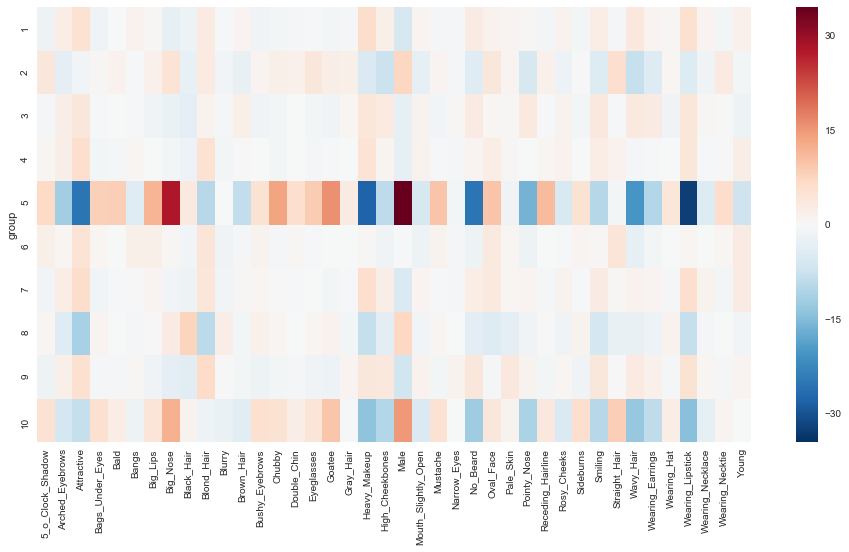

In [307]:
# using the percent differences above to 
# create a heatmap for better visuals
plt.figure(figsize=(16,8))
sns.heatmap((((a.groupby(['group']).mean()) - a.mean()) * 100).drop(['Unnamed: 0','group'],axis=1),cmap='RdBu_r')
plt.show()

## Anaysis

Looking at the heatmap and the images from the clusters I don’t think this model was very successful in clustering facial features.  Once thing that could be causing a major problem is the differences in backgrounds.  I think they are adding a lot of noise.  Looking at group 8 every single image has a darker background. While group 6 has every image on a white or light gray background. But if you compare that to their features on the heat map they are pretty close to the average.  

Another feature that isn’t mapped but could influence the clusters are the clothing the celebrities are wearing.  For example, from the images in cluster 6 it looks a lot are wearing a dark shirt or suit.  Some possible solutions to these problems would be to create a kernel to blur or remove the outside of the image.  Another solution would be to use edge detection kernel to try and just look at the values within the outline of the face. 

Last, I think that my encoder could have work better.  With it if I tried to process the data more than a few times it would generate nan values which makes clustering impossible. 

In [306]:
# detection kernel  np.array([ [-1,-1,-1],[-1,8,-1],[-1,-1,-1] ])